<a href="https://colab.research.google.com/github/Mafaz03/ReditScraper/blob/main/Scrapedit_dl%20v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -q praw
!pip install torchinfo

from datetime import datetime
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
import praw
import pandas as pd
from tqdm import tqdm
import requests
from PIL import Image
from torchvision import transforms
from io import BytesIO
import numpy as np
import seaborn as sns
from collections import Counter

import torch
from torch.utils.data import Dataset, DataLoader
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from tqdm import tqdm
import torchvision.transforms as transforms

from torchinfo import summary


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.0/191.0 kB 2.0 MB/s eta 0:00:00


In [30]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
pd.set_option('display.max_rows', None)

In [4]:
reddit = praw.Reddit(client_id = "",
            client_secret = "",
            username = "",
            password = "",
            redirect_uri = "http://localhost:8080",
            user_agent = "",
            check_for_async=False)


In [5]:
class ResizeWithPadding(object):
  def __init__(self, size):
    self.size = size
  def __call__(self, img):
    w, h = img.size
    aspect_ratio = w / h
    if aspect_ratio > 1:
      new_w = self.size
      new_h = int(self.size / aspect_ratio)
    else:
      new_h = self.size
      new_w = int(self.size * aspect_ratio)
    resized_img = img.resize((new_w, new_h))
    new_img = Image.new("RGB", (self.size, self.size), color=(0, 0, 0))
    left = (self.size - new_w) // 2
    top = (self.size - new_h) // 2
    new_img.paste(resized_img, (left, top))
    return new_img

In [71]:
sub = reddit.subreddit("cars")
sub.subreddit_type

'public'

In [82]:
from PIL import UnidentifiedImageError

class InvalidSubreddit(Exception):
    pass
class RestrictedSubreddit(Exception):
    pass

class ScrapeditDataset(Dataset):
  def __init__(self, subreddit: list, limit=10, sortby='year', show_safe=None, max_size=500, transform=None):
    if transform: self.transform = transform
    else: self.transform = transforms.ToTensor()
    self.subreddit = subreddit
    self.max_size = max_size
    self.results = {}
    print(f"Collecting Data from {len(self.subreddit)} subreddits")
    for r in self.subreddit:
      sub = reddit.subreddit(r)
      try:
        sub_type = sub.subreddit_type
        if sub_type != 'public':
          raise RestrictedSubreddit(f"r/{r} is restricted to public access")
      except: raise InvalidSubreddit(f"r/{r} is invalid Subreddit, make sure the subreddit is valid")
      sub_itter = sub.top(sortby, limit=limit)
      self.result = []
      for submission in tqdm(sub_itter, total = limit):
        self.d = {}
        try: self.d['image'] = submission.preview["images"][0]["source"]["url"]
        except: self.d['image'] = None
        self.d['domain'] = submission.domain
        self.result.append(self.d)
      self.results[r] = self.result

    self.colated_ds = []
    print(f"Collecting Images from {len(self.subreddit)} subreddits")
    for r in self.subreddit:
      for image in tqdm(self.results[r], total = len(self.results)) :
        try:
          response = requests.get(image['image'])
          pil_image = Image.open(BytesIO(response.content))
          self.colated_ds.append([pil_image, r])
        except: pass

    z = [i[1] for i in self.colated_ds]
    self.ds_count = dict(Counter(z))

  def __call__(self):
    plt.bar(self.ds_count.keys(), self.ds_count.values())
    plt.show()

  def __len__(self):
    return len(self.colated_ds)

  def __getitem__(self, idx):
    pil_image, y = self.colated_ds[idx]
    try:
      pil_image.thumbnail((self.max_size, self.max_size), Image.LANCZOS)
      if pil_image.mode != 'RGB': pil_image = pil_image.convert('RGB')
      img_tensor = self.transform(pil_image)
      if img_tensor.shape[0] == 3: img_tensor = img_tensor.permute(1, 2, 0)
      np_image = np.array(img_tensor)
      return {'image': np_image, 'y': y}
    except UnidentifiedImageError:
      return None

In [182]:
size = 100
transform_resize=transforms.Compose([
                              ResizeWithPadding(size=size),
                              transforms.Resize((size,size)),
                              transforms.ToTensor()
                              ])

subreddits = ['Pizza', 'burgers']
dataset = ScrapeditDataset(subreddit=subreddits, limit = 200, transform = transform_resize, max_size = 100, show_safe = True)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

bs = 50
train_dataloader = DataLoader(train_dataset, batch_size = bs, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size = bs, shuffle=True)

100%|██████████| 200/200 [01:26<00:00,  2.30it/s]


100%|██████████| 200/200 [00:48<00:00,  4.13it/s]


200it [00:22,  8.78it/s]
200it [00:31,  6.43it/s]


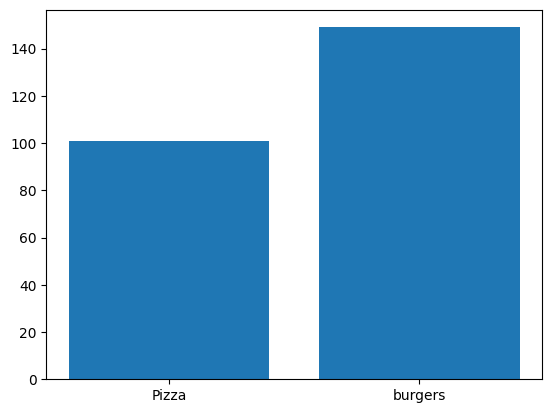

In [183]:
dataset()

In [184]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [185]:
len(dataset)

250

In [186]:
sample_batch = next(iter(train_dataloader))

In [187]:
import math
def show_batch(sample_batch, max = 25, X = 'image', y = 'y', cmap=None, **kwargs):
  if max:
    images = sample_batch[X][:max]
    labels = sample_batch[y][:max]
  else:
    images = sample_batch[X]
    labels = sample_batch[y]

  img_len = images.shape[0]
  row = int(math.sqrt(img_len))
  img_len = row ** 2

  fig, axes = plt.subplots(row, row, figsize=(25,25))
  axes = axes.flatten()

  for i in range(img_len):
    axes[i].imshow(images[i], **kwargs)
    axes[i].set_title(labels[i])
    axes[i].axis('off')

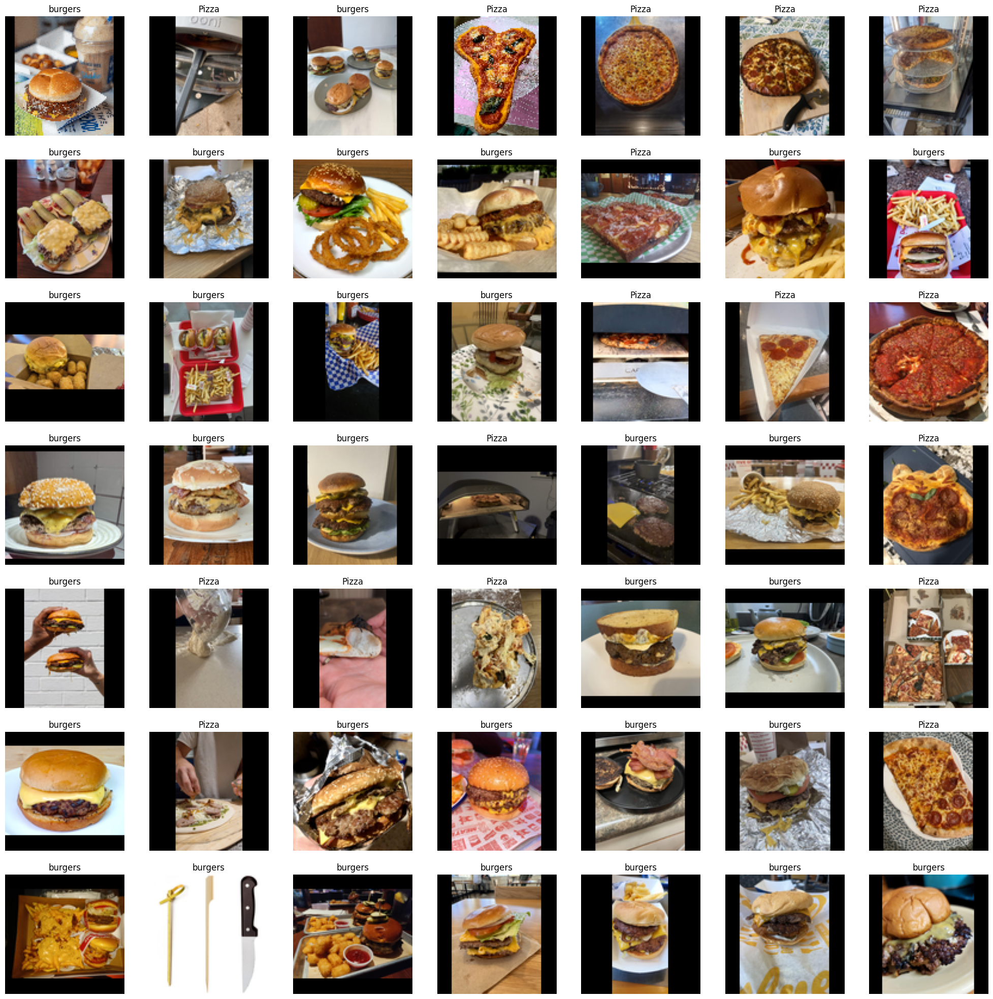

In [188]:
show_batch(sample_batch = sample_batch, max = 100)

In [189]:
import torch.nn.functional as F
from torch import nn
flatten = nn.Flatten()

class MyModel(nn.Module):
  def __init__(self):
    super(MyModel, self).__init__()
    self.features = nn.Sequential(
      nn.Conv2d(100, 8, kernel_size=3, stride=2, padding=1),
      nn.ReLU(),
      nn.Conv2d(8, 16, kernel_size=3, stride=2, padding=1),
      nn.ReLU(),
      nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
      nn.ReLU(),
      nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
      nn.ReLU(),
      nn.Conv2d(64, 3, kernel_size=3, stride=2, padding=1)
    )

    self.global_pool = nn.AdaptiveAvgPool2d(1)

  def forward(self, x):
    x = self.features(x)
    x = self.global_pool(x)
    x = flatten(x)  # Flatten the feature maps
    # Get the index of the highest probability for each image
    return x
    _, predicted_classes = torch.max(x, 1)
    return predicted_classes

In [190]:
model = MyModel()
model.to(device)

MyModel(
  (features): Sequential(
    (0): Conv2d(100, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(64, 3, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  )
  (global_pool): AdaptiveAvgPool2d(output_size=1)
)

In [191]:
r_map = {j:i for i, j in enumerate(subreddits)}
r_map_rev = {i:j for i, j in enumerate(subreddits)}

In [192]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Define number of epochs
num_epochs = 50
accs = []
losses = []
accs_test = []
losses_test = []

# Training loop
for epoch in range(num_epochs):
  running_loss = 0.0
  running_loss_test = 0.0
  running_accuracy = 0.0
  running_accuracy_test = 0.0

  for i, data in enumerate(train_dataloader):
    # Get the inputs; data is a list of [inputs, labels]
    # inputs, labels = data
    inputs = data['image'].to(device)
    y = data['y']

    # Zero the parameter gradients
    optimizer.zero_grad()

    # Forward + backward + optimize
    y_pred = model(inputs)
    y = torch.asarray([r_map[i] for i in y]).to(device)

    accuracy = (sum(y_pred.argmax(1) ==  y)/len(y)).item()
    accs.append(accuracy)

    loss = criterion(y_pred, y)
    losses.append(loss)

    loss.backward()
    optimizer.step()

    # Print statistics
    running_accuracy += accuracy
    running_loss += loss.item()
  epoch_loss = running_loss / len(train_dataloader)
  epoch_accuracy = running_accuracy / len(train_dataloader)
  print(f'TRAINING: Epoch {epoch + 1}, Loss: {epoch_loss:.3f}, Accuracy: {epoch_accuracy*100:.3f}')

  with torch.no_grad():
    for i, data in enumerate(test_dataloader):
      inputs = data['image'].to(device)
      y = data['y']

      y_pred = model(inputs)
      y = torch.asarray([r_map[i] for i in y]).to(device)
      accuracy_test = (sum(y_pred.argmax(1) ==  y)/len(y)).item()
      accs_test.append(accuracy_test)
      loss_test = criterion(y_pred, y)
      losses_test.append(loss_test)

      running_accuracy_test += accuracy_test
      running_loss_test += loss_test

    epoch_loss_test = running_loss_test / len(test_dataloader)
    epoch_accuracy_test = running_accuracy_test / len(test_dataloader)
    print(f'TESTING: Epoch {epoch + 1}, Loss: {epoch_loss_test:.3f}, Accuracy: {epoch_accuracy_test*100:.3f}\n')




TRAINING: Epoch 1, Loss: 0.854, Accuracy: 61.000
TESTING: Epoch 1, Loss: 2.024, Accuracy: 54.000

TRAINING: Epoch 2, Loss: 1.314, Accuracy: 41.000
TESTING: Epoch 2, Loss: 0.777, Accuracy: 54.000

TRAINING: Epoch 3, Loss: 0.829, Accuracy: 61.000
TESTING: Epoch 3, Loss: 0.828, Accuracy: 54.000

TRAINING: Epoch 4, Loss: 0.777, Accuracy: 61.000
TESTING: Epoch 4, Loss: 0.731, Accuracy: 54.000

TRAINING: Epoch 5, Loss: 0.683, Accuracy: 61.000
TESTING: Epoch 5, Loss: 0.722, Accuracy: 54.000

TRAINING: Epoch 6, Loss: 0.676, Accuracy: 61.000
TESTING: Epoch 6, Loss: 0.756, Accuracy: 54.000

TRAINING: Epoch 7, Loss: 0.681, Accuracy: 61.000
TESTING: Epoch 7, Loss: 0.721, Accuracy: 54.000

TRAINING: Epoch 8, Loss: 0.664, Accuracy: 61.000
TESTING: Epoch 8, Loss: 0.705, Accuracy: 54.000

TRAINING: Epoch 9, Loss: 0.662, Accuracy: 61.000
TESTING: Epoch 9, Loss: 0.695, Accuracy: 54.000

TRAINING: Epoch 10, Loss: 0.664, Accuracy: 61.000
TESTING: Epoch 10, Loss: 0.694, Accuracy: 54.000

TRAINING: Epoch 11

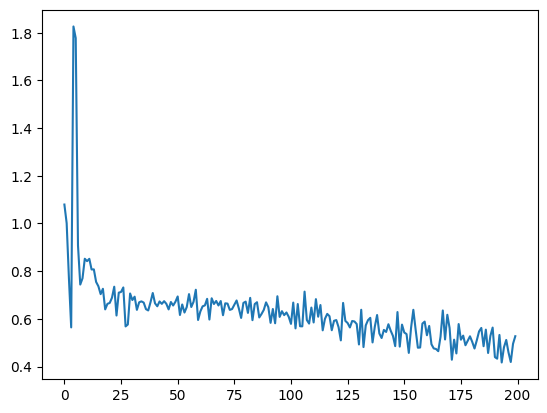

In [193]:
plt.plot([i.item() for i in losses])

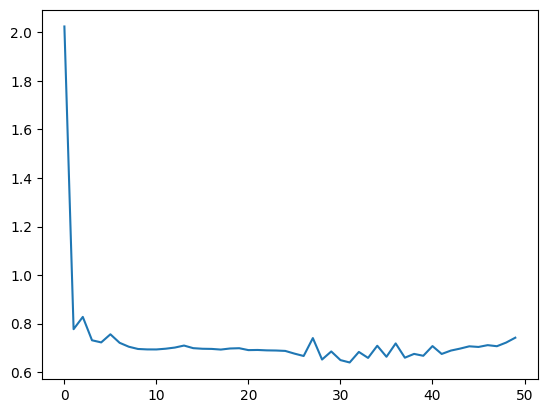

In [194]:
plt.plot([i.item() for i in losses_test])

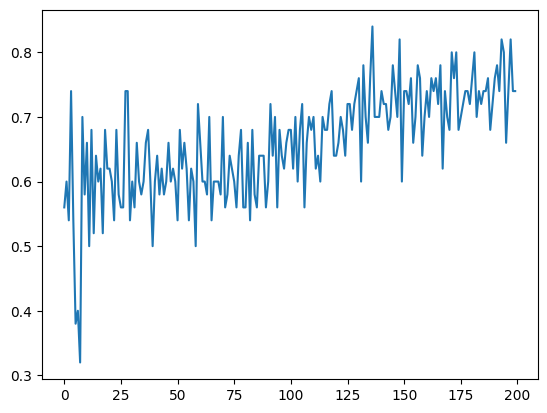

In [195]:
plt.plot(accs)

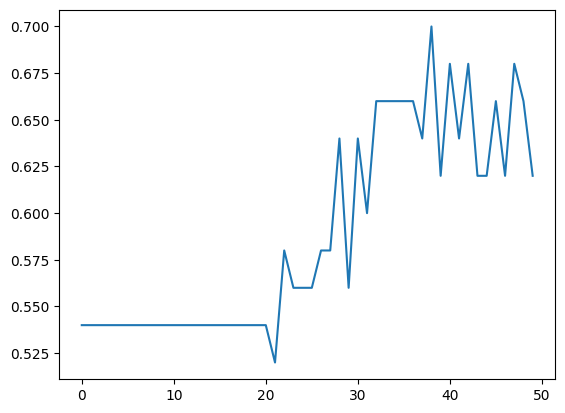

In [196]:
plt.plot(accs_test)

In [198]:
inputs = sample_batch['image'].to(device)
y_pred = model(inputs)
y = y_pred.argmax(1)
y = [r_map_rev[i.item()] for i in y]
sample_batch['y'] = y

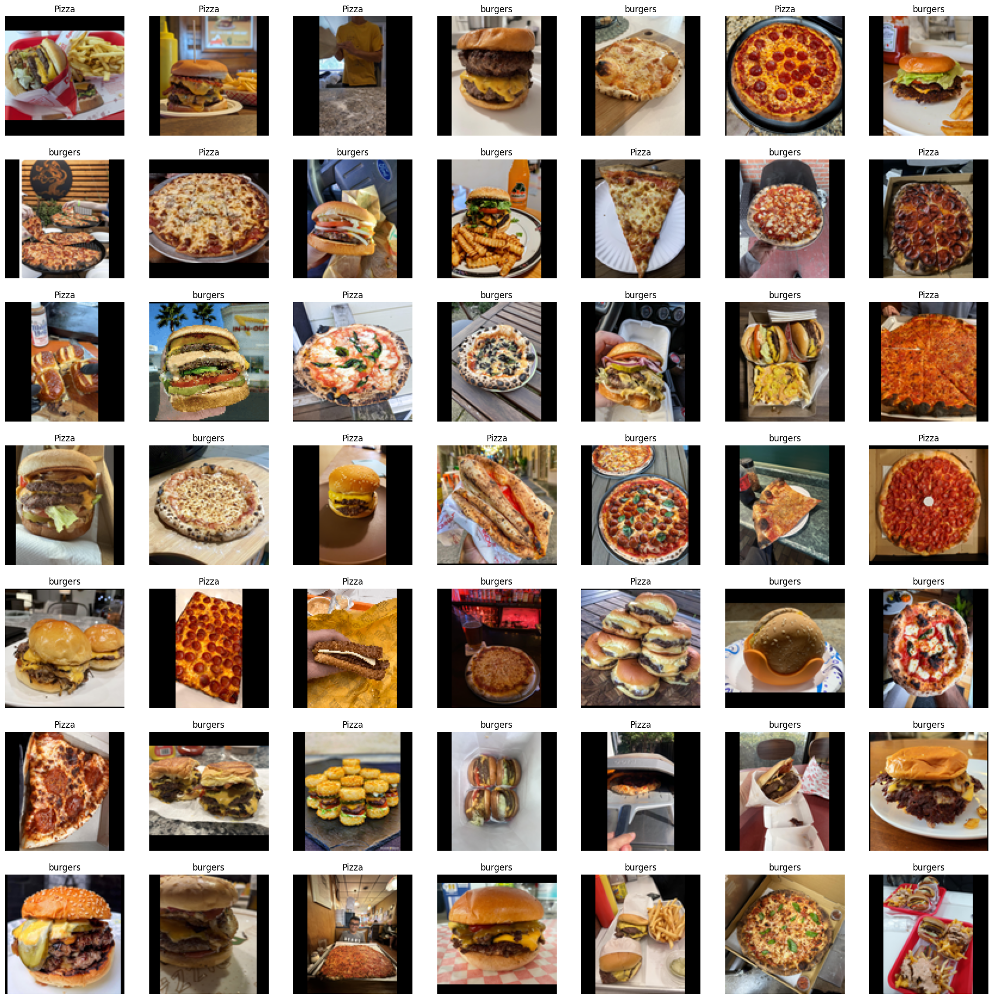

In [199]:
sample_batch = next(iter(test_dataloader))
show_batch(sample_batch = sample_batch, max = None)

In [200]:
import torchvision
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

In [201]:
summary(model=model,
        input_size=(50, 3, 100, 100), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [50, 3, 100, 100]    [50, 1000]           --                   True
├─Sequential (features)                                      [50, 3, 100, 100]    [50, 1280, 4, 4]     --                   True
│    └─Conv2dNormActivation (0)                              [50, 3, 100, 100]    [50, 32, 50, 50]     --                   True
│    │    └─Conv2d (0)                                       [50, 3, 100, 100]    [50, 32, 50, 50]     864                  True
│    │    └─BatchNorm2d (1)                                  [50, 32, 50, 50]     [50, 32, 50, 50]     64                   True
│    │    └─SiLU (2)                                         [50, 32, 50, 50]     [50, 32, 50, 50]     --                   --
│    └─Sequential (1)                                        [50, 32, 50, 50]     [50, 16, 50,

In [202]:
for param in model.features.parameters():
  param.requires_grad = False

In [203]:
640.0/2

320.0

In [204]:
output_shape = len(subreddits)

# Recreate the classifier layer and seed it to the target device
model.classifier = torch.nn.Sequential(
  torch.nn.Dropout(p=0.2, inplace=True),
  torch.nn.Linear(in_features=1280,
                  out_features=output_shape, # same number of output units as our number of classes
                  bias=True)).to(device)

In [205]:
summary(model,
        input_size=(50, 3, 100, 100), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [50, 3, 100, 100]    [50, 2]              --                   Partial
├─Sequential (features)                                      [50, 3, 100, 100]    [50, 1280, 4, 4]     --                   False
│    └─Conv2dNormActivation (0)                              [50, 3, 100, 100]    [50, 32, 50, 50]     --                   False
│    │    └─Conv2d (0)                                       [50, 3, 100, 100]    [50, 32, 50, 50]     (864)                False
│    │    └─BatchNorm2d (1)                                  [50, 32, 50, 50]     [50, 32, 50, 50]     (64)                 False
│    │    └─SiLU (2)                                         [50, 32, 50, 50]     [50, 32, 50, 50]     --                   --
│    └─Sequential (1)                                        [50, 32, 50, 50]     [50, 

In [206]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Define number of epochs
num_epochs = 50
accs = []
losses = []
accs_test = []
losses_test = []

# Training loop
for epoch in range(num_epochs):
  running_loss = 0.0
  running_loss_test = 0.0
  running_accuracy = 0.0
  running_accuracy_test = 0.0

  for i, data in enumerate(train_dataloader):
    # Get the inputs; data is a list of [inputs, labels]
    # inputs, labels = data
    inputs = data['image'].to(device)
    y = data['y']

    # Zero the parameter gradients
    optimizer.zero_grad()

    # Forward + backward + optimize
    y_pred = model(inputs.reshape(-1,3,100,100))
    y = torch.asarray([r_map[i] for i in y]).to(device)

    accuracy = (sum(y_pred.argmax(1) ==  y)/len(y)).item()
    accs.append(accuracy)

    loss = criterion(y_pred, y)
    losses.append(loss)

    loss.backward()
    optimizer.step()

    # Print statistics
    running_accuracy += accuracy
    running_loss += loss.item()
  epoch_loss = running_loss / len(train_dataloader)
  epoch_accuracy = running_accuracy / len(train_dataloader)
  print(f'TRAINING: Epoch {epoch + 1}, Loss: {epoch_loss:.3f}, Accuracy: {epoch_accuracy*100:.3f}')

  with torch.no_grad():
    for i, data in enumerate(test_dataloader):
      inputs = data['image'].to(device)
      y = data['y']

      y_pred = model(inputs.reshape(-1,3,100,100))
      y = torch.asarray([r_map[i] for i in y]).to(device)
      accuracy_test = (sum(y_pred.argmax(1) ==  y)/len(y)).item()
      accs_test.append(accuracy_test)
      loss_test = criterion(y_pred, y)
      losses_test.append(loss_test)

      running_accuracy_test += accuracy_test
      running_loss_test += loss_test

    epoch_loss_test = running_loss_test / len(test_dataloader)
    epoch_accuracy_test = running_accuracy_test / len(test_dataloader)
    print(f'TESTING: Epoch {epoch + 1}, Loss: {epoch_loss_test:.3f}, Accuracy: {epoch_accuracy_test*100:.3f}\n')




TRAINING: Epoch 1, Loss: 0.712, Accuracy: 54.500
TESTING: Epoch 1, Loss: 0.672, Accuracy: 66.000

TRAINING: Epoch 2, Loss: 0.387, Accuracy: 82.500
TESTING: Epoch 2, Loss: 0.721, Accuracy: 60.000

TRAINING: Epoch 3, Loss: 0.364, Accuracy: 84.000
TESTING: Epoch 3, Loss: 0.821, Accuracy: 56.000

TRAINING: Epoch 4, Loss: 0.260, Accuracy: 90.000
TESTING: Epoch 4, Loss: 0.906, Accuracy: 66.000

TRAINING: Epoch 5, Loss: 0.223, Accuracy: 92.000
TESTING: Epoch 5, Loss: 0.821, Accuracy: 72.000

TRAINING: Epoch 6, Loss: 0.205, Accuracy: 92.000
TESTING: Epoch 6, Loss: 0.774, Accuracy: 72.000

TRAINING: Epoch 7, Loss: 0.173, Accuracy: 94.000
TESTING: Epoch 7, Loss: 0.999, Accuracy: 68.000

TRAINING: Epoch 8, Loss: 0.196, Accuracy: 91.000
TESTING: Epoch 8, Loss: 0.768, Accuracy: 66.000

TRAINING: Epoch 9, Loss: 0.206, Accuracy: 92.000
TESTING: Epoch 9, Loss: 1.086, Accuracy: 60.000

TRAINING: Epoch 10, Loss: 0.187, Accuracy: 93.500
TESTING: Epoch 10, Loss: 1.069, Accuracy: 70.000

TRAINING: Epoch 11

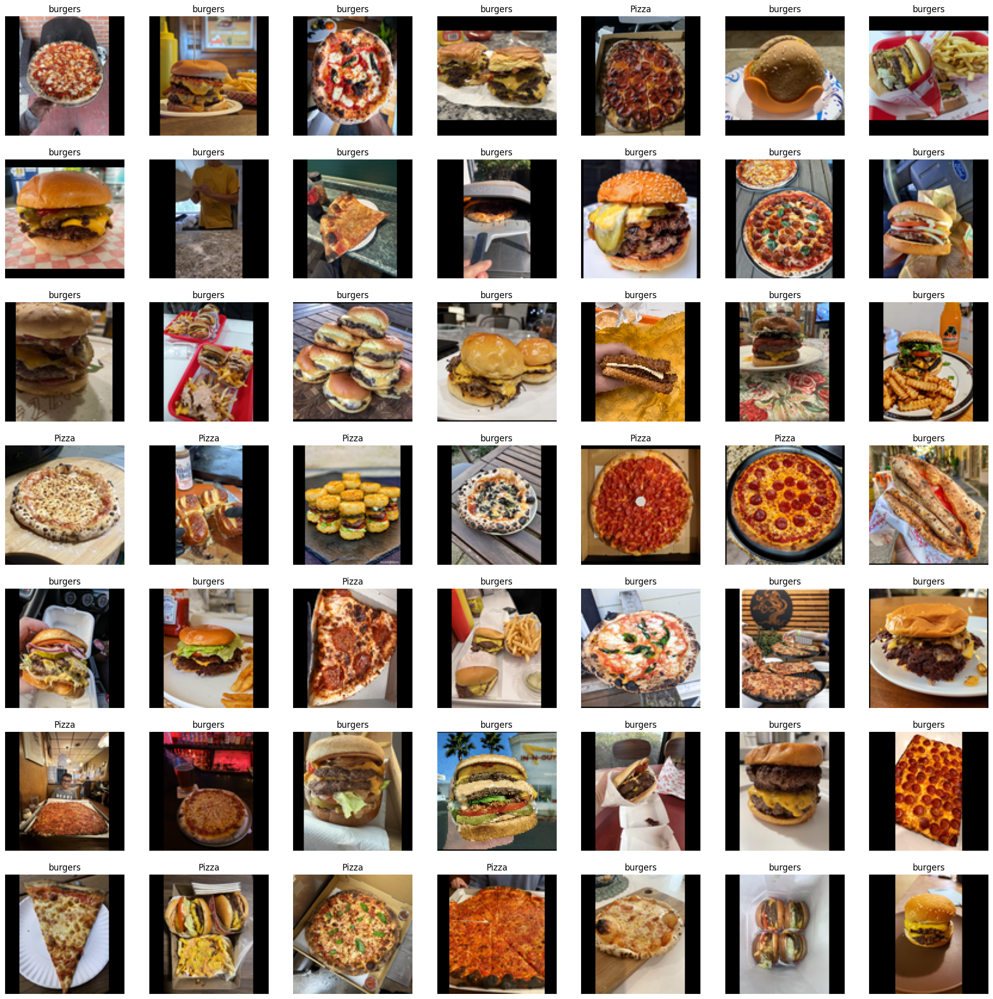

In [209]:
sample_batch = next(iter(test_dataloader))

inputs = sample_batch['image'].to(device)
y_pred = model(inputs.reshape(-1,3,100,100))
y = y_pred.argmax(1)
y = [r_map_rev[i.item()] for i in y]
sample_batch['y'] = y

show_batch(sample_batch = sample_batch, max = None)